# Buildmodel

Build nonlinear time series models from scalar time series data using minimum description length radila basis function formalism

## Sample data

First we generate some typical test data to play with

In [1]:
include("ChaosFunctions.jl")

┌ Info: Precompiling DifferentialEquations [0c46a032-eb83-5123-abaf-570d42b7fbaa]
└ @ Base loading.jl:1278


addnoise (generic function with 1 method)

In [2]:
using Plots

In [3]:
z=lorenzpoints(5000,0.05)

3×5001 Array{Float64,2}:
 -9.3954   -9.11588  -8.65294  -8.14648  …   0.348011  -0.90338  -1.72562
 -9.09342  -8.3313   -7.63451  -7.18491     -2.88828   -2.83896  -3.19333
 28.5537   28.7701   28.4925   27.8354      24.9674    21.8964   19.3518

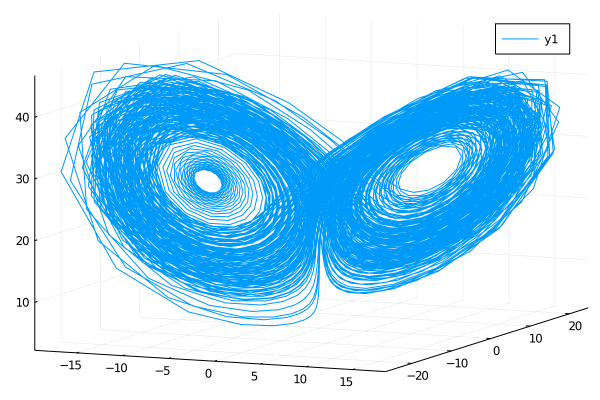

In [4]:
plot(z[1,:],z[2,:],z[3,:])

In [5]:
z=rosslerpoints(5000,0.2)

3×5001 Array{Float64,2}:
 -2.09051    -1.75877    -1.34197   …  -0.459284  -1.49662   -2.20517
 -1.45337    -1.90718    -2.303         3.23109    3.15526    2.90361
  0.0252208   0.0261013   0.027361      3.509      0.936751   0.227118

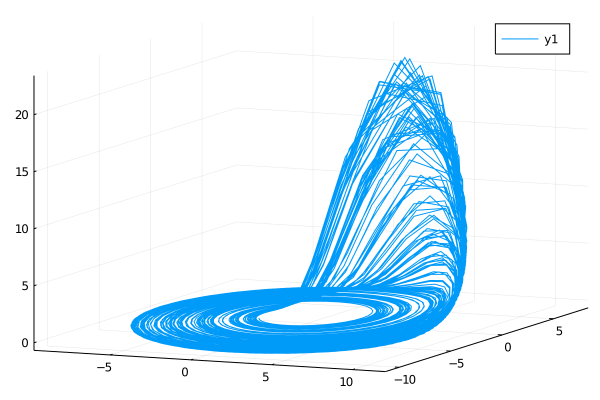

In [6]:
plot(z[1,:],z[2,:],z[3,:])

In [7]:
z=itmap(tinkerbell,-[0.7, 0.6],10000)

2×10000 Array{Float64,2}:
 -0.106024  -0.00524985   0.0848639  …  -0.0789416  -0.43416   -0.148745
 -0.407701  -0.329446    -0.171764      -0.978687   -0.492709  -0.686846

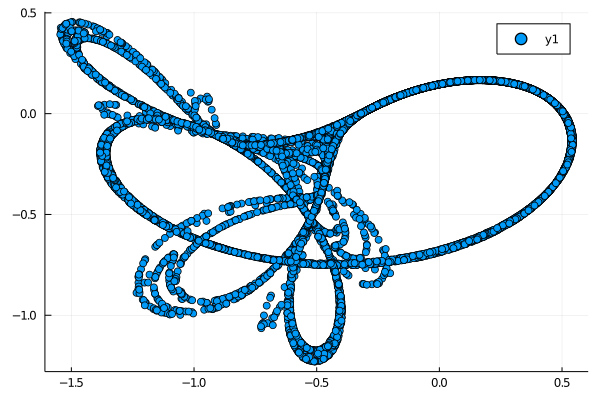

In [8]:
plot(z[2,:],z[1,:],linetype=:dots)

In [9]:
zn=addnoise(z,0.05)

2×10000 Array{Float64,2}:
 -0.146001   0.0122041   0.0488953  …  -0.0837863  -0.409489  -0.170591
 -0.402836  -0.338999   -0.175032      -0.972319   -0.48995   -0.66518

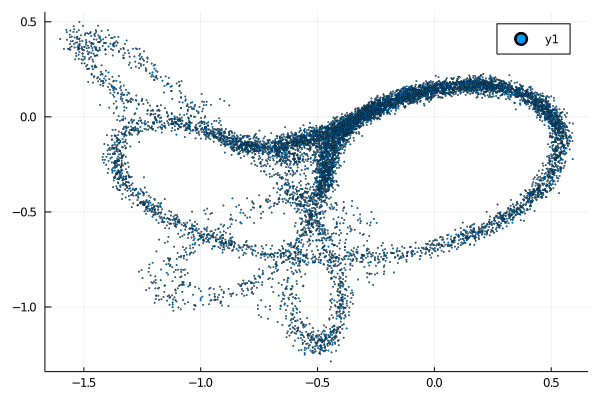

In [10]:
plot(zn[2,:],zn[1,:],linetype=:dots,markersize=1,markerstrokewidth=0.5)

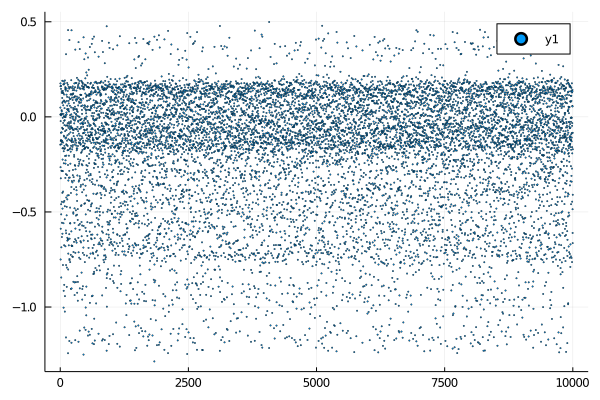

In [11]:
plot(zn[1,:],linetype=:dots,markersize=1,markerstrokewidth=0.5)

In [12]:
z=itmap(logistic,1/π,10^4);

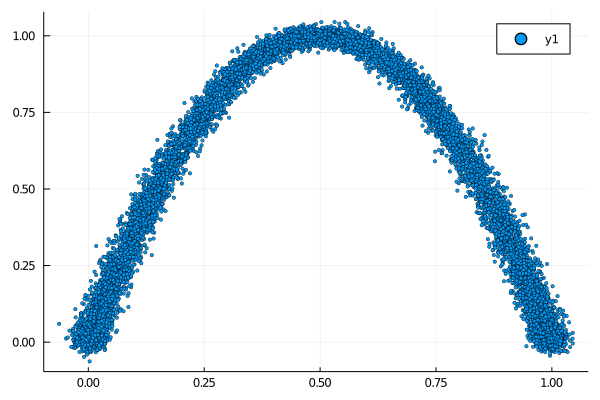

In [13]:
z=itmap(logistic,1/π,10^4);
zn=addnoise(z,0.05)
plot(zn[1:end-1],zn[2:end],linetype=:dots,markersize=2,markerstrokewidth = 0.5)

## Build the model

Import the modelling code, and away we go.

In [14]:
include("BasisFunctionTypes.jl")
include("Place.jl")

┌ Info: Precompiling ToeplitzMatrices [c751599d-da0a-543b-9d20-d0a503d91d24]
└ @ Base loading.jl:1278


Main.Place

Any valid inline function can be used as a penlaty function (it must operate on globally defined functions in `Place.topdown` and must return a scalar, the algorithm seeks a minimum of this function. Four useful examples follow (description length ala `Rissanen` requires extra computation in the main code to account for parameter precisions.

In [15]:
#need to make these variables in scope of the current WS
nx=Int64(length(z))
mss=Float64(Inf)
λ=Array{Float64,1}[]
δ=Array{Float64,1}[]
#valid penalty criteria
Schwarz = :(nx*log(mss)+nk*log(nx))
Akaike = :(nx*log(mss)+2*nk)
Rissanen = :(description(mss,λ,δ,nx)) #Rissanen desciption length
Model30 = :(-nk*(nk<=30))
#nx is # of observation (length of data)
#nk is # of parameters (basis functions in model)
#mss is the mean-sum-square model prediction error
#λ are the model parameters and δ their precisions

:(-nk * (nk <= 30))

Next, the dictionary `options` defined model structure and optional modelling parameters (it'll run a produce something even if `options` is empty, but it might be better to populate this somewhat intelligently. A useful example to model the (admittedly rather simple) logistic map is provided

In [16]:
options=Dict("stopstep"=>10,
    "testdatum"=> 8000,
    "functions"=> (gaussian,tophat),
    "embedding" => Place.vembed([0,1,2,3]),
 #   "embedding" => ([0, 1], [0, 1, 2, 3]),
    "penalty"=> Rissanen,
    "nneighbours"=> 1
    )

Dict{String,Any} with 6 entries:
  "penalty"     => :(description(mss, λ, δ, nx))
  "stopstep"    => 10
  "embedding"   => ([0], [1], [0, 1], [2], [0, 2], [1, 2], [0, 1, 2], [3], [0, …
  "testdatum"   => 8000
  "functions"   => (gaussian, tophat)
  "nneighbours" => 1

And, then, away we go...

In [17]:
mymodel, X, zout, mdlv = Place.buildmodel(zn,options)

dx=4, nx=7999
needδ=true
*MSS=0.12388028851023748 DL=3001.865624112299 size=1
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=0.10949220458892787 DL=2513.0887675225144 size=2
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=0.03604402493950154 DL=-1932.3239685804476 size=2
*MSS=0.03257521093418485 DL=-2327.254231432094 size=3
*MSS=0.028778692197343945 DL=-2821.9055694140548 size=3
*MSS=0.016485477990248337 DL=-5043.762885717156 size=4
*MSS=0.015582573250275839 DL=-5261.811892166884 size=5
*MSS=0.015214062059713918 DL=-5351.422807145246 size=6
*MSS=0.012603004525822808 DL=-6102.964676522596 size=6
*MSS=0.010948987388168633 DL=-6665.929244896371 size=6
*MSS=0.01077520751319837 DL=-6723.058451010299 size=7
*MSS=0.008272399517907328 DL=-7779.899043218384 size=7
*MSS=0.008034981800500288 DL=-7888.595643807318 size=8
*MSS=0.007992156676118276 DL=-7903.734813901934 size=9
*MSS=0.007786145300811529 DL=-8008.138380730557 size=9
*MSS=0.007587352436862974 DL=-81

(Main.Place.PlaceModel(Main.Place.BasisFunc[Main.Place.BasisFunc(tophat, [0], 0.7251951729369535, [0.8914473201589646 0.4448100379848671 … 0.585789267008952 0.1420181803198012], [4.145318519636678]), Main.Place.BasisFunc(tophat, [0, 1], 0.5922227677580126, [0.8914473201589646 0.4448100379848671 … 0.585789267008952 0.1420181803198012; 0.627101400265259 0.12222966053902881 … 0.8486407998427077 0.0657762103583128], [4.763117934571126]), Main.Place.BasisFunc(tophat, [0, 1], 0.19717851489637458, [0.8914473201589646 0.4448100379848671 … 0.585789267008952 0.1420181803198012; 0.627101400265259 0.12222966053902881 … 0.8486407998427077 0.0657762103583128], [3.2989584331277877]), Main.Place.BasisFunc(tophat, [1, 2], 0.17327586470402717, [0.627101400265259 0.12222966053902881 … 0.8486407998427077 0.0657762103583128; 0.756281354019818 0.024451220170502712 … 0.31434173605026794 0.9856224425615858], [3.9934260026440613]), Main.Place.BasisFunc(gaussian, [1], 0.4250428817850642, [0.627101400265259 0.12

Modelling done, we can make one-step predictions on time series data

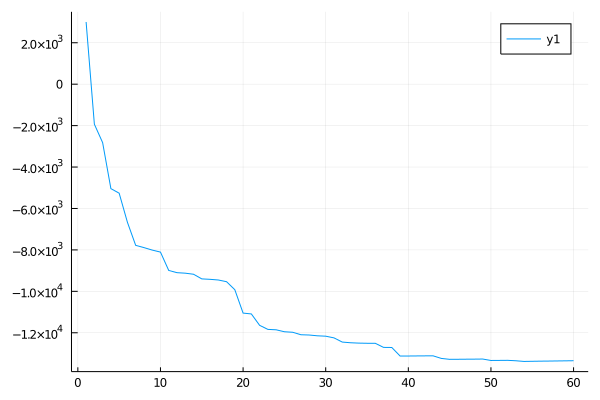

In [18]:
plot(mdlv)

In [19]:
yt,yp,ep = Place.predict(mymodel, z);

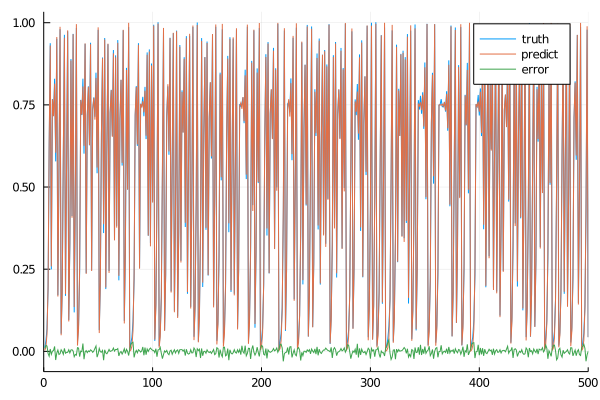

In [20]:
plot(yt,label="truth")
plot!(yp,label="predict")
plot!(ep,label="error",xlimit=(0,500))

Or, free run simulations

In [21]:
yp, yt = Place.freerun(mymodel,zn,500)

([0.035702268530079025, 0.13436652098700488, 0.45559412159243784, 1.0037966226139274, 0.020390842311148207, 0.08675610845538916, 0.29205329814025194, 0.8242021226500041, 0.5631460622064465, 0.9694941977357538  …  0.4237327556221466, 0.9830192514365536, 0.0918742158949679, 0.32109585492045845, 0.8779897530566375, 0.4439418442299014, 0.9806896791429962, 0.0546932227929334, 0.21244834666010126, 0.6763281425754639], [0.009981075462828053, 0.0005126863278602095, 0.031919596302524916, 0.19625036541744187, 0.6572285101116139, 0.9527590005838212, 0.24622534205472524, 0.7526663349390862, 0.6962120469438585, 0.8114223043832482  …  0.140013544925733, 0.500943977874387, 0.9870708298410172, 0.0028372670406409803, 0.0232050047779917, 0.020236600346984997, 0.1464412083159302, 0.43739652096257853, 1.010580472092428, 0.05290849144974267])

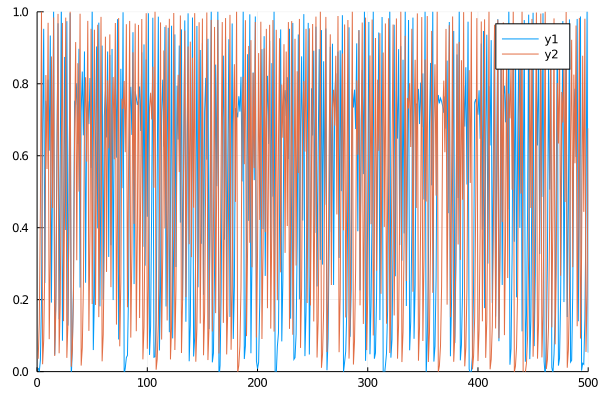

In [22]:
plot(yt)
plot!(yp,ylimit=(0,1),xlimit=(0,500))


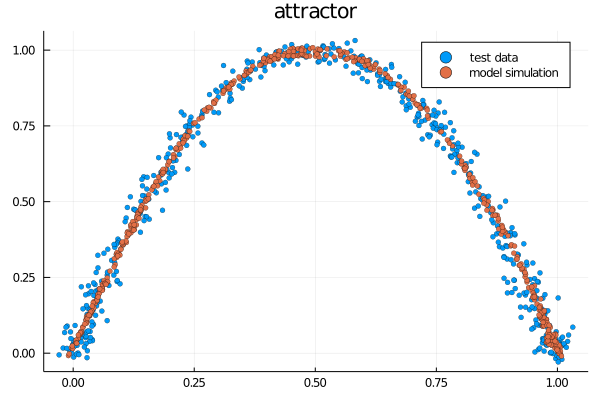

In [23]:
plot(yt[1:end-1],yt[2:end],linetype=:dots,markersize=3,markerstrokewidth = 0.3,label="test data")
plot!(yp[1:end-1],yp[2:end],linetype=:dots,markersize=3,markerstrokewidth = 0.3,label="model simulation",title="attractor")

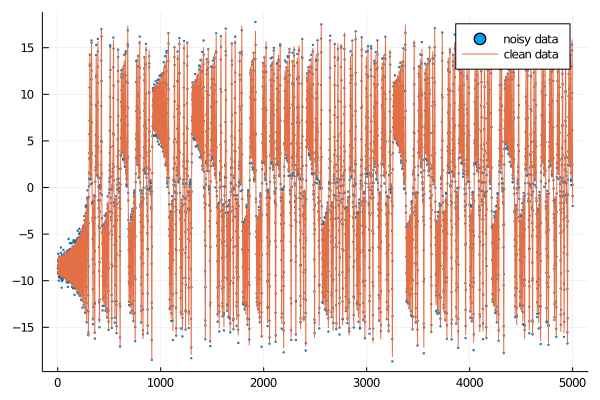

In [24]:
z=lorenzpoints(5000,0.05)
y=z[1,:]
yn=addnoise(y,0.05)
plot(yn,linetype=:dots,markersize=1.2,markerstrokewidth = 0.3,label="noisy data")
plot!(y,label="clean data")

In [25]:
options=Dict("stopstep"=>10,
    "testdatum"=> 8000,
    "functions"=> (gaussian,tophat),
    "embedding" => Place.vembed([0,1,2,3,6,12]),
 #   "embedding" => ([0, 1], [0, 1, 2, 3]),
    "penalty"=> Rissanen,
    "nneighbours"=> 1
    )

Dict{String,Any} with 6 entries:
  "penalty"     => :(description(mss, λ, δ, nx))
  "stopstep"    => 10
  "embedding"   => ([0], [1], [0, 1], [2], [0, 2], [1, 2], [0, 1, 2], [3], [0, …
  "testdatum"   => 8000
  "functions"   => (gaussian, tophat)
  "nneighbours" => 1

In [26]:
mymodel, X, zout, mdlv = Place.buildmodel(yn,options)

dx=13, nx=4488
needδ=true
*MSS=4.60321007979752 DL=9798.222840585466 size=1
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=3.0453499460757723 DL=8876.151705142009 size=2
*MSS=2.7171848391218 DL=8625.964789799546 size=3
*MSS=2.6625229825443544 DL=8585.661217040395 size=4
*MSS=1.591447852705724 DL=7432.419592587855 size=4
MSS=1.5892977116579405 DL=7435.844301856305 size=5
*MSS=1.5865547819264791 DL=7431.573698375976 size=5
*MSS=1.4259417758415325 DL=7190.407629326755 size=5
*MSS=1.1361744115963315 DL=6680.085063434253 size=5
MSS=1.1353145377463931 DL=6684.879165187754 size=6
*MSS=0.9426417585301929 DL=6266.726602667105 size=6
*MSS=0.9107167256325513 DL=6196.565404713944 size=7
*MSS=0.9071221199428691 DL=6193.952330082316 size=8
*MSS=0.8907041911586061 DL=6152.589224725858 size=8
*MSS=0.8854079281519739 DL=6146.013038809378 size=9
*MSS=0.883008801643362 DL=6140.585226540084 size=9
MSS=0.8818687690378724 DL=6143.98907438835 size=10
*MSS=0.8345783440594962 DL=6018.5217051

(Main.Place.PlaceModel(Main.Place.BasisFunc[Main.Place.BasisFunc(tophat, [1], 4.695693796899128, [2.309826203652999 -5.739006070187952 … -5.726701758912901 -6.669033550072198], [1.8866830249297468]), Main.Place.BasisFunc(tophat, [0, 1, 6], 11.3413030814039, [3.8077810487642747 -9.4385432208216 … -6.339377428070375 -9.3321239896041; 2.309826203652999 -5.739006070187952 … -5.726701758912901 -6.669033550072198; -2.697046120548035 -0.5458395333288266 … -1.0760043870574862 -1.9002461656429621], [4.618572154832814]), Main.Place.BasisFunc(gaussian, [2], 8.60281739968756, [1.3479406331946664 -3.7839988664228468 … -3.477063014483607 -4.906645827091554], Any[]), Main.Place.BasisFunc(tophat, [2, 6], 6.61756297408489, [1.3479406331946664 -3.7839988664228468 … -3.477063014483607 -4.906645827091554; -2.697046120548035 -0.5458395333288266 … -1.0760043870574862 -1.9002461656429621], [3.6199968529178825]), Main.Place.BasisFunc(tophat, [3, 6], 7.590708777198935, [1.3007601032768106 -1.5520557877978334 …

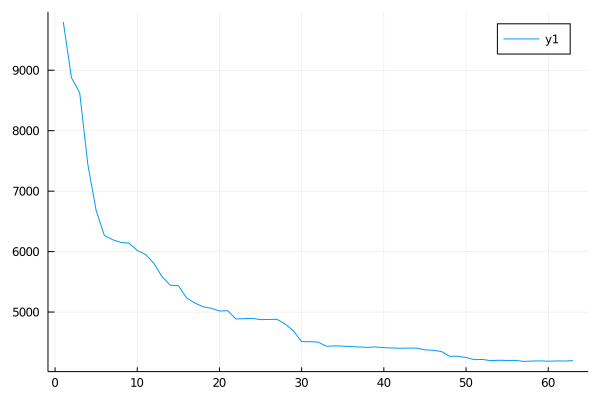

In [27]:
plot(mdlv)

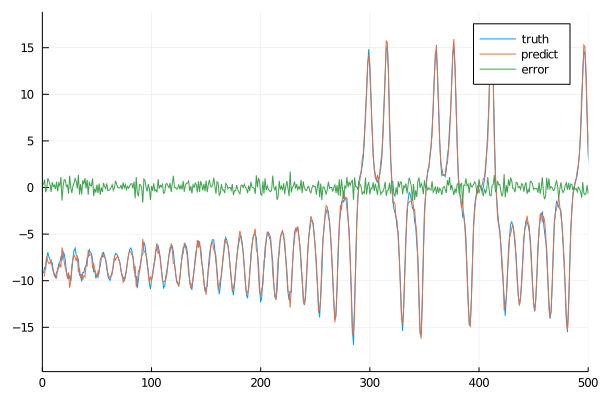

In [28]:
yt,yp,ep = Place.predict(mymodel, yn);
plot(yt,label="truth")
plot!(yp,label="predict")
plot!(ep,label="error",xlimit=(0,500))

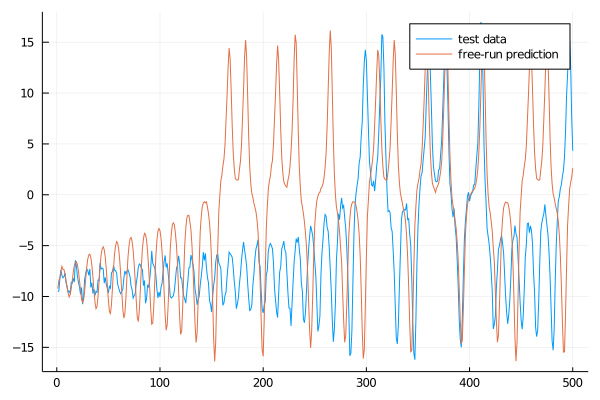

In [29]:
yp, yt = Place.freerun(mymodel,yn,500)
plot(yt,label="test data")
plot!(yp,label="free-run prediction")

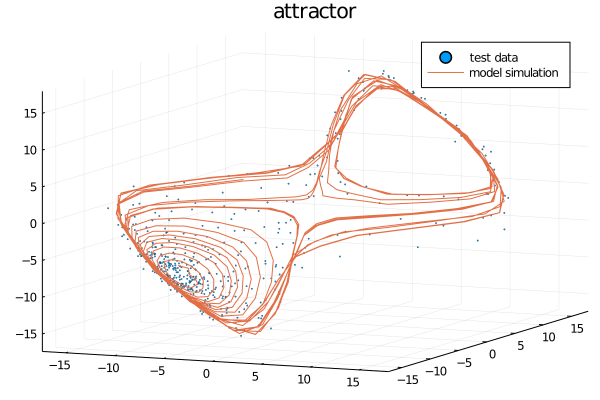

In [30]:
plot(yt[1:end-6],yt[4:end-3],yt[7:end],linetype=:dots,markersize=1,markerstrokewidth = 0.3,label="test data")
plot!(yp[1:end-6],yp[4:end-3],yp[7:end],label="model simulation",title="attractor")

## Michael Small

Last updated today ... 6/4/21